In [1]:
import os
from PIL import Image
import torch
import numpy as np
from tqdm import tqdm
from transformers import SegformerFeatureExtractor, SegformerForSemanticSegmentation

/home/andreafabbricatore/.local/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-05-13 15:31:04.722273: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1747143064.740685 2091770 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1747143064.746453 2091770 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1747143064.761764 2091770 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than on

In [9]:
# === CONFIG ===
IMAGE_DIR = "input_images"
OUTPUT_DIR = "segmented_output"
MODEL_NAME = "nvidia/segformer-b0-finetuned-cityscapes-768-768"

# Cityscapes class mapping
CITYSCAPES_ID2LABEL = {
    0: 'road', 1: 'sidewalk', 2: 'building', 3: 'wall', 4: 'fence',
    5: 'pole', 6: 'traffic_light', 7: 'traffic_sign', 8: 'vegetation', 9: 'terrain',
    10: 'sky', 11: 'person', 12: 'rider', 13: 'car', 14: 'truck',
    15: 'bus', 16: 'train', 17: 'motorcycle', 18: 'bicycle',
}

# === SETUP ===
os.makedirs(OUTPUT_DIR, exist_ok=True)
for class_name in CITYSCAPES_ID2LABEL.values():
    os.makedirs(os.path.join(OUTPUT_DIR, class_name), exist_ok=True)


In [4]:
# Load model
feature_extractor = SegformerFeatureExtractor.from_pretrained(MODEL_NAME)
model = SegformerForSemanticSegmentation.from_pretrained(MODEL_NAME).eval()

preprocessor_config.json:   0%|          | 0.00/272 [00:00<?, ?B/s]

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/transformers/models/segformer/feature_extraction_segformer.py:28: FutureWarning: The class SegformerFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use SegformerImageProcessor instead.
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/transformers/utils/deprecation.py:172: UserWarning: The following named arguments are not valid for `SegformerFeatureExtractor.__init__` and were ignored: 'feature_extractor_type'
  return func(*args, **kwargs)


config.json:   0%|          | 0.00/1.68k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/15.0M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/14.9M [00:00<?, ?B/s]

In [7]:
def segment_and_save(image_path):
    image = Image.open(image_path).convert("RGB")
    image_np = np.array(image)
    inputs = feature_extractor(images=image, return_tensors="pt")

    with torch.no_grad():
        outputs = model(**inputs)
        logits = outputs.logits  # (1, num_classes, h/4, w/4)
        upsampled_logits = torch.nn.functional.interpolate(
            logits,
            size=image.size[::-1],  # (H, W)
            mode="bilinear",
            align_corners=False
        )
        predicted = upsampled_logits.argmax(dim=1)[0].cpu().numpy()  # (H, W)

    base_name = os.path.splitext(os.path.basename(image_path))[0]

    for class_idx, class_name in CITYSCAPES_ID2LABEL.items():
        mask = (predicted == class_idx).astype(np.uint8)

        if np.any(mask):
            # Apply mask to original image
            masked_img = image_np.copy()
            masked_img[mask == 0] = 0  # Zero out everything except target class

            masked_pil = Image.fromarray(masked_img)
            save_path = os.path.join(OUTPUT_DIR, class_name, f"{base_name}_{class_name}.png")
            masked_pil.save(save_path)


In [10]:
image_files = [f for f in os.listdir(IMAGE_DIR) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

for filename in tqdm(image_files, desc="Segmenting images"):
    segment_and_save(os.path.join(IMAGE_DIR, filename))

print("Done. Masks saved in:", OUTPUT_DIR)


Segmenting images: 100%|██████████| 1/1 [00:01<00:00,  1.97s/it]

Done. Masks saved in: segmented_output


In [1]:
country_to_continent = {
    "Albania": "Europe",
    "Andorra": "Europe",
    "Argentina": "South America",
    "Australia": "Oceania",
    "Austria": "Europe",
    "Bangladesh": "Asia",
    "Belgium": "Europe",
    "Bhutan": "Asia",
    "Bolivia": "South America",
    "Botswana": "Africa",
    "Brazil": "South America",
    "Bulgaria": "Europe",
    "Cambodia": "Asia",
    "Canada": "North America",
    "Chile": "South America",
    "Colombia": "South America",
    "Croatia": "Europe",
    "Czechia": "Europe",
    "Denmark": "Europe",
    "Dominican Republic": "North America",
    "Ecuador": "South America",
    "Estonia": "Europe",
    "Eswatini": "Africa",
    "Finland": "Europe",
    "France": "Europe",
    "Germany": "Europe",
    "Ghana": "Africa",
    "Greece": "Europe",
    "Greenland": "North America",
    "Guatemala": "North America",
    "Hungary": "Europe",
    "Iceland": "Europe",
    "Indonesia": "Asia",
    "Ireland": "Europe",
    "Israel": "Asia",
    "Italy": "Europe",
    "Japan": "Asia",
    "Jordan": "Asia",
    "Kenya": "Africa",
    "Kyrgyzstan": "Asia",
    "Latvia": "Europe",
    "Lesotho": "Africa",
    "Lithuania": "Europe",
    "Luxembourg": "Europe",
    "Malaysia": "Asia",
    "Mexico": "North America",
    "Mongolia": "Asia",
    "Montenegro": "Europe",
    "Netherlands": "Europe",
    "New Zealand": "Oceania",
    "Nigeria": "Africa",
    "North Macedonia": "Europe",
    "Norway": "Europe",
    "Palestine": "Asia",
    "Peru": "South America",
    "Philippines": "Asia",
    "Poland": "Europe",
    "Portugal": "Europe",
    "Romania": "Europe",
    "Russia": "Europe",
    "Senegal": "Africa",
    "Serbia": "Europe",
    "Singapore": "Asia",
    "Slovakia": "Europe",
    "Slovenia": "Europe",
    "South Africa": "Africa",
    "South Korea": "Asia",
    "Spain": "Europe",
    "Sri Lanka": "Asia",
    "Sweden": "Europe",
    "Switzerland": "Europe",
    "Taiwan": "Asia",
    "Thailand": "Asia",
    "Turkey": "Asia",
    "Ukraine": "Europe",
    "United Arab Emirates": "Asia",
    "United Kingdom": "Europe",
    "United States": "North America",
    "Uruguay": "South America"
}


In [5]:
import os
import shutil
from tqdm import tqdm

# Define paths
base_path = "/home/andreafabbricatore/rainbot/datasets/segmented"
excluded_segments = {"bus", "train", "rider", "truck", "motorcycle"}
segments = [d for d in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, d)) and d not in excluded_segments]

# This must be defined
# country_to_continent = {"France": "Europe", "Japan": "Asia", ...}
continents = set(country_to_continent.values())

# Create directories: train/Europe, test/Asia, etc.
for segment in segments:
    continent_root = os.path.join(base_path, segment, "final_datasets_continents")
    for split in ["train", "test", "val"]:
        for continent in continents:
            os.makedirs(os.path.join(continent_root, split, continent), exist_ok=True)

# Process and copy files
for segment in segments:
    print(f"\nProcessing {segment} segment...")
    dataset_path = os.path.join(base_path, segment, "final_datasets")

    for split in ["train", "test", "val"]:
        split_path = os.path.join(dataset_path, split)
        if not os.path.exists(split_path):
            continue

        countries = [d for d in os.listdir(split_path) if os.path.isdir(os.path.join(split_path, d))]

        for country in tqdm(countries, desc=f"{segment}: {split} set"):
            if country not in country_to_continent:
                continue

            continent = country_to_continent[country]
            country_dir = os.path.join(split_path, country)
            files = os.listdir(country_dir)

            for file in files:
                src = os.path.join(country_dir, file)
                dst = os.path.join(base_path, segment, "final_datasets_continents",
                                   split, continent, f"{country}_{file}")
                shutil.copy2(src, dst)

print("\n✅ Dataset reorganization complete!")



Processing terrain segment...


terrain: train set:   0%|          | 0/79 [00:00<?, ?it/s]

terrain: val set: 100%|██████████| 79/79 [00:00<00:00, 205.81it/s]



Processing road segment...


road: val set: 100%|██████████| 79/79 [00:00<00:00, 152.79it/s]



Processing car segment...


car: val set: 100%|██████████| 79/79 [00:00<00:00, 507.39it/s]



Processing building segment...


building: val set: 100%|██████████| 79/79 [00:00<00:00, 233.03it/s]



Processing pole segment...


pole: val set: 100%|██████████| 79/79 [00:00<00:00, 440.65it/s]



Processing vegetation segment...


vegetation: val set: 100%|██████████| 79/79 [00:00<00:00, 98.90it/s] 



Processing traffic_light segment...


traffic_light: val set: 100%|██████████| 79/79 [00:00<00:00, 3528.60it/s]



Processing bicycle segment...


bicycle: val set: 100%|██████████| 79/79 [00:00<00:00, 3861.62it/s]



Processing fence segment...


fence: val set: 100%|██████████| 79/79 [00:00<00:00, 469.02it/s]



Processing person segment...


person: val set: 100%|██████████| 79/79 [00:00<00:00, 942.94it/s]



Processing sidewalk segment...


sidewalk: val set: 100%|██████████| 79/79 [00:00<00:00, 351.36it/s]



Processing traffic_sign segment...


traffic_sign: val set: 100%|██████████| 79/79 [00:00<00:00, 919.31it/s]


✅ Dataset reorganization complete!


In [7]:
import cv2
import numpy as np
from pathlib import Path
import os

def check_black_pixels(image_path, threshold=0.95):
    """Check if an image has more than threshold% black pixels."""
    img = cv2.imread(str(image_path))
    if img is None:
        print(f"Could not read image: {image_path}")
        return False
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Count black pixels (value < 10)
    black_pixels = np.sum(gray < 10)
    total_pixels = gray.size
    
    return (black_pixels / total_pixels) > threshold

# Process all segments and splits
for segment in segments:
    print(f"\nProcessing {segment} segment...")
    dataset_path = Path(base_path) / segment / "final_datasets"
    
    for split in ["train", "test", "val"]:
        split_path = dataset_path / split
        if not split_path.exists():
            continue
            
        countries = [d for d in os.listdir(split_path) if os.path.isdir(split_path / d)]
        
        for country in countries:
            country_path = split_path / country
            print(f"\nChecking {split}/{country}...")
            black_images = []
            
            for img_path in country_path.glob("*.png"):
                if check_black_pixels(img_path):
                    black_images.append(img_path)
            
            if black_images:
                print(f"Found {len(black_images)} images with >95% black pixels in {country}")
                for img_path in black_images:
                    os.remove(img_path)
                    print(f"  - Deleted: {img_path.name}")
            else:
                print(f"No images with >95% black pixels found in {country}")

print("\n✅ Black pixel cleanup complete!")



Processing terrain segment...

Checking train/Montenegro...
Found 175 images with >95% black pixels in Montenegro
  - Deleted: Montenegro_143_terrain.png
  - Deleted: Montenegro_490_terrain.png
  - Deleted: Montenegro_33_terrain.png
  - Deleted: Montenegro_391_terrain.png
  - Deleted: Montenegro_135_terrain.png
  - Deleted: cropped_canvas_1629769236_terrain.png
  - Deleted: Montenegro_283_terrain.png
  - Deleted: Montenegro_484_terrain.png
  - Deleted: Montenegro_234_terrain.png
  - Deleted: Montenegro_500_terrain.png
  - Deleted: Montenegro_262_terrain.png
  - Deleted: Montenegro_210_terrain.png
  - Deleted: Montenegro_172_terrain.png
  - Deleted: Montenegro_351_terrain.png
  - Deleted: Montenegro_70_terrain.png
  - Deleted: Montenegro_157_terrain.png
  - Deleted: Montenegro_257_terrain.png
  - Deleted: Montenegro_306_terrain.png
  - Deleted: Montenegro_73_terrain.png
  - Deleted: Montenegro_166_terrain.png
  - Deleted: cropped_canvas_1629937693_terrain.png
  - Deleted: Montenegro_22

In [8]:
import os
import shutil
import random
from pathlib import Path

def balance_splits(train_dir, val_dir, test_dir, train_ratio=0.8, val_ratio=0.1):
    """
    Balance train/val/test splits to achieve 80:10:10 ratio while preserving test set
    """
    # Get all images from train and val directories
    train_images = [f for f in os.listdir(train_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]
    val_images = [f for f in os.listdir(val_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]
    test_images = [f for f in os.listdir(test_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]
    
    # Combine train and val images
    train_val_images = train_images + val_images
    
    # Calculate target sizes based on test set size
    n_test = len(test_images)
    n_total_target = int(n_test / (1 - train_ratio - val_ratio))  # Target total size
    n_train_target = int(n_total_target * train_ratio)
    n_val_target = int(n_total_target * val_ratio)
    
    print(f"Current test set size: {n_test}")
    print(f"Target train set size: {n_train_target}")
    print(f"Target val set size: {n_val_target}")
    
    # Shuffle and split train/val images
    random.shuffle(train_val_images)
    new_train_images = train_val_images[:n_train_target]
    new_val_images = train_val_images[n_train_target:n_train_target + n_val_target]
    
    # Create temporary directory for shuffling
    temp_dir = train_dir.parent / "temp"
    os.makedirs(temp_dir, exist_ok=True)
    
    # Move all train/val images to temp directory
    for img in train_val_images:
        src = train_dir / img if img in train_images else val_dir / img
        dst = temp_dir / img
        shutil.move(str(src), str(dst))
    
    # Move images to their new locations
    for img in new_train_images:
        shutil.move(str(temp_dir / img), str(train_dir / img))
    
    for img in new_val_images:
        shutil.move(str(temp_dir / img), str(val_dir / img))
    
    # Clean up temp directory
    shutil.rmtree(temp_dir)

# Base directory containing all segment types
base_dir = "/home/andreafabbricatore/rainbot/datasets/segmented"

# Process each segment type and country
base_path = Path(base_dir)
for segment_dir in base_path.iterdir():
    if not segment_dir.is_dir():
        continue
        
    print(f"\nProcessing {segment_dir.name}...")
    
    # Get train, val, and test directories
    train_dir = segment_dir / "final_datasets" / "train"
    val_dir = segment_dir / "final_datasets" / "val"
    test_dir = segment_dir / "final_datasets" / "test"
    
    if not all(d.exists() for d in [train_dir, val_dir, test_dir]):
        print(f"  Skipping {segment_dir.name} - one or more split directories missing")
        continue
    
    # Process each country
    for country_dir in train_dir.iterdir():
        if not country_dir.is_dir():
            continue
            
        print(f"  Processing {country_dir.name}...")
        
        # Balance splits for this country
        balance_splits(
            train_dir=train_dir / country_dir.name,
            val_dir=val_dir / country_dir.name,
            test_dir=test_dir / country_dir.name
        )

print("\n✅ Dataset balancing completed successfully!")



Processing terrain...
  Processing Montenegro...
Current test set size: 21
Target train set size: 168
Target val set size: 21
  Processing Ukraine...
Current test set size: 26
Target train set size: 208
Target val set size: 26
  Processing Germany...
Current test set size: 13
Target train set size: 104
Target val set size: 13
  Processing Australia...
Current test set size: 38
Target train set size: 304
Target val set size: 38
  Processing Kenya...
Current test set size: 31
Target train set size: 248
Target val set size: 31
  Processing Belgium...
Current test set size: 25
Target train set size: 200
Target val set size: 25
  Processing Ecuador...
Current test set size: 8
Target train set size: 64
Target val set size: 8
  Processing Bulgaria...
Current test set size: 28
Target train set size: 224
Target val set size: 28
  Processing Hungary...
Current test set size: 33
Target train set size: 264
Target val set size: 33
  Processing Italy...
Current test set size: 18
Target train set si

In [9]:
# Calculate and print train:test:val ratios for each segment type
print("Train:Test:Val ratios (80:10:10) for each segment type:")

segments_to_skip = []

# Get all segment types
segments = os.listdir(base_dir)

for segment_type in segments:
    print(f"\n{segment_type}:")
    
    # Get countries from train directory
    train_path = os.path.join(base_dir, segment_type, "final_datasets", "train")
    if not os.path.exists(train_path):
        continue
        
    countries = os.listdir(train_path)
    
    for country in countries:
        # Count images in each split
        train_count = len(os.listdir(os.path.join(train_path, country)))
        test_count = len(os.listdir(os.path.join(base_dir, segment_type, "final_datasets", "test", country)))
        val_count = len(os.listdir(os.path.join(base_dir, segment_type, "final_datasets", "val", country)))
        
        total = train_count + test_count + val_count
        
        try:
            # Calculate actual ratios
            train_ratio = train_count / total
            test_ratio = test_count / total
            val_ratio = val_count / total
            
            print(f"{country}:")
            print(f"  Train: {train_ratio:.2%}")
            print(f"  Test:  {test_ratio:.2%}")
            print(f"  Val:   {val_ratio:.2%}")
        except ZeroDivisionError:
            segments_to_skip.append(f"{segment_type}/{country}")

if segments_to_skip:
    print("\nSegments with zero images (skipped):")
    for segment in segments_to_skip:
        print(f"- {segment}")


Train:Test:Val ratios (80:10:10) for each segment type:

terrain:
Montenegro:
  Train: 81.16%
  Test:  10.14%
  Val:   8.70%
Ukraine:
  Train: 88.84%
  Test:  11.16%
  Val:   0.00%
Germany:
  Train: 80.00%
  Test:  10.00%
  Val:   10.00%
Australia:
  Train: 88.89%
  Test:  11.11%
  Val:   0.00%
Kenya:
  Train: 87.02%
  Test:  10.88%
  Val:   2.11%
Belgium:
  Train: 80.00%
  Test:  10.00%
  Val:   10.00%
Ecuador:
  Train: 80.00%
  Test:  10.00%
  Val:   10.00%
Bulgaria:
  Train: 80.00%
  Test:  10.00%
  Val:   10.00%
Hungary:
  Train: 80.49%
  Test:  10.06%
  Val:   9.45%
Italy:
  Train: 80.00%
  Test:  10.00%
  Val:   10.00%
Canada:
  Train: 85.39%
  Test:  10.67%
  Val:   3.93%
Russia:
  Train: 83.02%
  Test:  10.38%
  Val:   6.60%
Peru:
  Train: 80.00%
  Test:  10.00%
  Val:   10.00%
Bolivia:
  Train: 85.57%
  Test:  14.43%
  Val:   0.00%
Ghana:
  Train: 80.00%
  Test:  10.00%
  Val:   10.00%
Indonesia:
  Train: 80.00%
  Test:  10.00%
  Val:   10.00%
Jordan:
  Train: 86.49%
  Test:  

In [11]:
set([i.split("/")[0] for i in segments_to_skip])

{'bicycle', 'car', 'fence', 'person', 'pole', 'traffic_light', 'traffic_sign'}

In [12]:
for segment_type in segments:
    print(f"\n{segment_type}:")
    
    # Get countries from train directory
    train_path = os.path.join(base_dir, segment_type, "final_datasets", "train")
    if not os.path.exists(train_path):
        continue
        
    countries = os.listdir(train_path)
    
    min_country = None
    min_total = float('inf')
    
    for country in countries:
        # Count images in each split
        train_count = len(os.listdir(os.path.join(train_path, country)))
        test_count = len(os.listdir(os.path.join(base_dir, segment_type, "final_datasets", "test", country)))
        val_count = len(os.listdir(os.path.join(base_dir, segment_type, "final_datasets", "val", country)))
        
        total = train_count + test_count + val_count
        
        if total < min_total:
            min_total = total
            min_country = country
    
    if min_country:
        print(f"Country with fewest images: {min_country} ({min_total} total images)")



terrain:
Country with fewest images: Jordan (37 total images)

road:
Country with fewest images: Eswatini (220 total images)

bus:

train:

car:
Country with fewest images: Hungary (0 total images)

building:
Country with fewest images: Eswatini (39 total images)

pole:
Country with fewest images: Montenegro (0 total images)

vegetation:
Country with fewest images: Ecuador (160 total images)

rider:

traffic_light:
Country with fewest images: Montenegro (0 total images)

bicycle:
Country with fewest images: Montenegro (0 total images)

fence:
Country with fewest images: Botswana (0 total images)

person:
Country with fewest images: Montenegro (0 total images)

truck:

sidewalk:
Country with fewest images: Estonia (16 total images)

motorcycle:

traffic_sign:
Country with fewest images: Montenegro (0 total images)


In [13]:
# Focus on road, vegetation, and terrain segments
target_segments = ['road', 'vegetation', 'terrain']

for segment_type in target_segments:
    print(f"\n{segment_type.upper()}:")
    
    # Get countries from train directory
    train_path = os.path.join(base_dir, segment_type, "final_datasets", "train")
    if not os.path.exists(train_path):
        print(f"No data found for {segment_type}")
        continue
        
    countries = os.listdir(train_path)
    
    # Store counts for each country
    country_counts = {}
    
    for country in countries:
        # Count images in each split
        train_count = len(os.listdir(os.path.join(train_path, country)))
        test_count = len(os.listdir(os.path.join(base_dir, segment_type, "final_datasets", "test", country)))
        val_count = len(os.listdir(os.path.join(base_dir, segment_type, "final_datasets", "val", country)))
        
        total = train_count + test_count + val_count
        country_counts[country] = total
    
    # Sort countries by total count
    sorted_countries = sorted(country_counts.items(), key=lambda x: x[1], reverse=True)
    
    # Print top 5 and bottom 5 countries
    print("\nTop 5 countries by image count:")
    for country, count in sorted_countries[:5]:
        print(f"- {country}: {count} images")
        
    print("\nBottom 5 countries by image count:")
    for country, count in sorted_countries[-5:]:
        print(f"- {country}: {count} images")
        
    # Print overall statistics
    total_images = sum(country_counts.values())
    avg_images = total_images / len(country_counts)
    print(f"\nOverall statistics:")
    print(f"- Total images: {total_images}")
    print(f"- Average images per country: {avg_images:.1f}")
    print(f"- Number of countries: {len(country_counts)}")



ROAD:

Top 5 countries by image count:
- Jordan: 449 images
- Greenland: 449 images
- Palestine: 449 images
- Kyrgyzstan: 448 images
- North Macedonia: 444 images

Bottom 5 countries by image count:
- Croatia: 290 images
- Estonia: 287 images
- Bhutan: 266 images
- Slovenia: 250 images
- Eswatini: 220 images

Overall statistics:
- Total images: 30688
- Average images per country: 388.5
- Number of countries: 79

VEGETATION:

Top 5 countries by image count:
- Bhutan: 435 images
- United States: 431 images
- Singapore: 431 images
- Germany: 430 images
- Finland: 430 images

Bottom 5 countries by image count:
- Greenland: 225 images
- Iceland: 220 images
- United Arab Emirates: 217 images
- Jordan: 194 images
- Ecuador: 160 images

Overall statistics:
- Total images: 28658
- Average images per country: 362.8
- Number of countries: 79

TERRAIN:

Top 5 countries by image count:
- Estonia: 400 images
- Latvia: 390 images
- Eswatini: 387 images
- Finland: 376 images
- Lesotho: 370 images

Bo

In [14]:
import os
import shutil
from tqdm import tqdm

# Define paths
base_path = "/home/andreafabbricatore/rainbot/datasets/segmented"
excluded_segments = {"bus", "train", "rider", "truck", "motorcycle"}
segments = [d for d in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, d)) and d not in excluded_segments]

# This must be defined
# country_to_continent = {"France": "Europe", "Japan": "Asia", ...}
continents = set(country_to_continent.values())

# Create directories: train/Europe, test/Asia, etc.
for segment in segments:
    continent_root = os.path.join(base_path, segment, "final_datasets_continents")
    for split in ["train", "test", "val"]:
        for continent in continents:
            os.makedirs(os.path.join(continent_root, split, continent), exist_ok=True)

# Process and copy files
for segment in segments:
    print(f"\nProcessing {segment} segment...")
    dataset_path = os.path.join(base_path, segment, "final_datasets")

    for split in ["train", "test", "val"]:
        split_path = os.path.join(dataset_path, split)
        if not os.path.exists(split_path):
            continue

        countries = [d for d in os.listdir(split_path) if os.path.isdir(os.path.join(split_path, d))]

        for country in tqdm(countries, desc=f"{segment}: {split} set"):
            if country not in country_to_continent:
                continue

            continent = country_to_continent[country]
            country_dir = os.path.join(split_path, country)
            files = os.listdir(country_dir)

            for file in files:
                src = os.path.join(country_dir, file)
                dst = os.path.join(base_path, segment, "final_datasets_continents",
                                   split, continent, f"{country}_{file}")
                shutil.copy2(src, dst)

print("\n✅ Dataset reorganization complete!")



Processing terrain segment...


terrain: val set: 100%|██████████| 79/79 [00:00<00:00, 319.89it/s]



Processing road segment...


road: val set: 100%|██████████| 79/79 [00:00<00:00, 176.74it/s]



Processing car segment...


car: val set: 100%|██████████| 79/79 [00:00<00:00, 2579.12it/s]



Processing building segment...


building: val set: 100%|██████████| 79/79 [00:00<00:00, 397.55it/s]



Processing pole segment...


pole: val set: 100%|██████████| 79/79 [00:00<00:00, 44807.30it/s]



Processing vegetation segment...


vegetation: val set: 100%|██████████| 79/79 [00:00<00:00, 152.30it/s]



Processing traffic_light segment...


traffic_light: val set: 100%|██████████| 79/79 [00:00<00:00, 75771.79it/s]



Processing bicycle segment...


bicycle: val set: 100%|██████████| 79/79 [00:00<00:00, 64603.24it/s]



Processing fence segment...


fence: val set: 100%|██████████| 79/79 [00:00<00:00, 1884.26it/s]



Processing person segment...


person: val set: 100%|██████████| 79/79 [00:00<00:00, 67047.76it/s]



Processing sidewalk segment...


sidewalk: val set: 100%|██████████| 79/79 [00:00<00:00, 1341.93it/s]



Processing traffic_sign segment...


traffic_sign: val set: 100%|██████████| 79/79 [00:00<00:00, 80133.01it/s]


✅ Dataset reorganization complete!


In [15]:
SEGMENTS = ['road', 'vegetation', 'terrain']
for segment in SEGMENTS:
    for split in ['train', 'test', 'val']:
        path = os.path.join(base_path, segment, "final_datasets", split)
        countries = [d for d in os.listdir(path) if os.path.isdir(os.path.join(path, d))]
        assert len(countries) == 79, f"Expected 79 countries for {segment} {split}, got {len(countries)}"


In [16]:
for segment_type in segments:
    print(f"\n{segment_type}:")
    
    # Get continents from train directory
    train_path = os.path.join(base_dir, segment_type, "final_datasets_continents", "train")
    if not os.path.exists(train_path):
        continue
        
    continents = os.listdir(train_path)
    
    min_continent = None
    min_total = float('inf')
    
    for continent in continents:
        # Count images in each split
        train_count = len(os.listdir(os.path.join(train_path, continent)))
        test_count = len(os.listdir(os.path.join(base_dir, segment_type, "final_datasets_continents", "test", continent)))
        val_count = len(os.listdir(os.path.join(base_dir, segment_type, "final_datasets_continents", "val", continent)))
        
        total = train_count + test_count + val_count
        
        if total < min_total:
            min_total = total
            min_continent = continent
    
    if min_continent:
        print(f"Continent with fewest images: {min_continent} ({min_total} total images)")



terrain:
Continent with fewest images: Oceania (934 total images)

road:
Continent with fewest images: Oceania (1016 total images)

car:
Continent with fewest images: Oceania (615 total images)

building:
Continent with fewest images: Oceania (801 total images)

pole:
Continent with fewest images: Oceania (732 total images)

vegetation:
Continent with fewest images: Oceania (1020 total images)

traffic_light:
Continent with fewest images: Oceania (138 total images)

bicycle:
Continent with fewest images: Oceania (102 total images)

fence:
Continent with fewest images: Oceania (638 total images)

person:
Continent with fewest images: Oceania (336 total images)

sidewalk:
Continent with fewest images: Oceania (767 total images)

traffic_sign:
Continent with fewest images: Oceania (360 total images)


In [17]:
def balance_dataset(base_path, dataset_type="countries"):
    """
    Balance datasets by reducing all classes to match the minimum class size
    while maintaining the 80:10:10 train/val/test split ratio
    """
    print(f"\nBalancing {dataset_type} dataset...")
    
    if dataset_type == "countries":
        # Get all segments
        segments = ['road', 'vegetation', 'terrain']
    else:
        segments = os.listdir(base_path)

    for segment in segments:
        print(f"\nProcessing {segment}...")
        
        # Determine paths based on dataset type
        if dataset_type == "countries":
            data_path = os.path.join(base_path, segment, "final_datasets")
        else:  # continents
            data_path = os.path.join(base_path, segment, "final_datasets_continents")
            
        # Find minimum total class size across all splits
        min_total = float('inf')
        min_class = None
        
        # Get all classes from train directory
        train_path = os.path.join(data_path, "train")
        if not os.path.exists(train_path):
            continue
            
        classes = os.listdir(train_path)
        for class_name in classes:
            total_images = 0
            for split in ['train', 'val', 'test']:
                split_path = os.path.join(data_path, split, class_name)
                if os.path.exists(split_path):
                    total_images += len(os.listdir(split_path))
            
            if total_images < min_total:
                min_total = total_images
                min_class = class_name
        
        if min_total == float('inf'):
            print(f"No valid classes found for {segment}")
            continue
            
        print(f"Minimum total class size: {min_total} ({min_class})")
        
        # Calculate target sizes for each split
        train_target = int(min_total * 0.8)
        val_target = int(min_total * 0.1)
        test_target = int(min_total * 0.1)
        
        # Balance each class
        for class_name in classes:
            for split, target_size in [('train', train_target), ('val', val_target), ('test', test_target)]:
                split_path = os.path.join(data_path, split, class_name)
                if not os.path.exists(split_path):
                    continue
                    
                images = os.listdir(split_path)
                if len(images) > target_size:
                    # Randomly select images to keep
                    images_to_keep = random.sample(images, target_size)
                    
                    # Remove excess images
                    for img in images:
                        if img not in images_to_keep:
                            os.remove(os.path.join(split_path, img))
                    
                    print(f"Reduced {class_name} {split} from {len(images)} to {target_size} images")

# Balance both datasets
balance_dataset(base_path, "countries")
balance_dataset(base_path, "continents")

print("\n✅ Dataset balancing complete!")



Balancing countries dataset...

Processing road...
Minimum total class size: 220 (Eswatini)
Reduced Montenegro train from 360 to 176 images
Reduced Montenegro val from 35 to 22 images
Reduced Montenegro test from 45 to 22 images
Reduced Ukraine train from 256 to 176 images
Reduced Ukraine val from 32 to 22 images
Reduced Ukraine test from 32 to 22 images
Reduced Germany train from 320 to 176 images
Reduced Germany val from 40 to 22 images
Reduced Germany test from 40 to 22 images
Reduced Australia train from 320 to 176 images
Reduced Australia val from 40 to 22 images
Reduced Australia test from 40 to 22 images
Reduced Kenya train from 320 to 176 images
Reduced Kenya val from 34 to 22 images
Reduced Kenya test from 40 to 22 images
Reduced Belgium train from 264 to 176 images
Reduced Belgium val from 33 to 22 images
Reduced Belgium test from 33 to 22 images
Reduced Ecuador train from 352 to 176 images
Reduced Ecuador val from 40 to 22 images
Reduced Ecuador test from 44 to 22 images
Re

/tmp/ipykernel_1203445/842084082.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
/tmp/ipykernel_1203445/842084082.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
/tmp/ipykernel_1203445/842084082.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
/tmp/ipykernel_1203445/842084082.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
/tmp/ipykernel_1203445/842084082.py:33: UserWarning: set

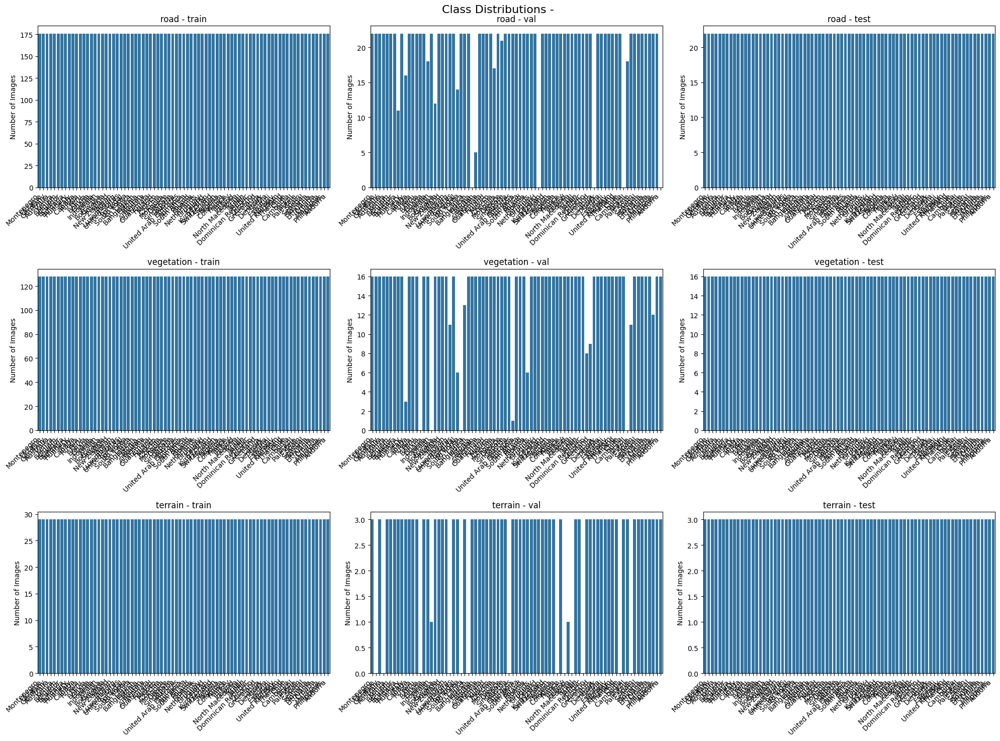

/tmp/ipykernel_1203445/842084082.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
/tmp/ipykernel_1203445/842084082.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
/tmp/ipykernel_1203445/842084082.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
/tmp/ipykernel_1203445/842084082.py:33: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
/tmp/ipykernel_1203445/842084082.py:33: UserWarning: set

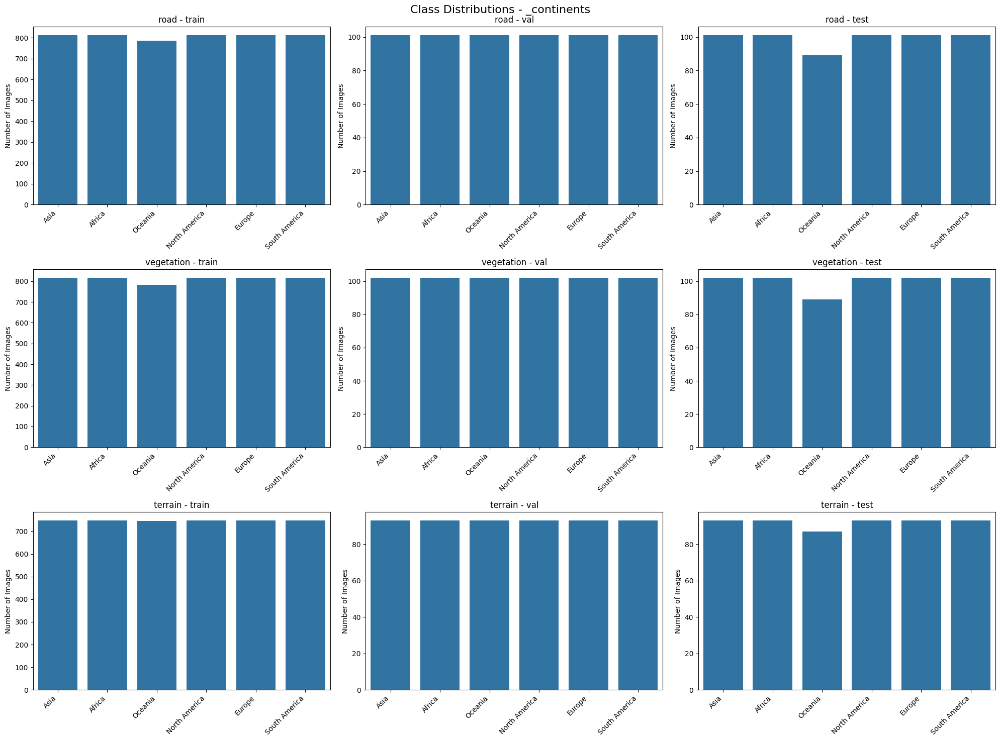

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import os
from pathlib import Path

def plot_distributions(base_path, dataset_type):
    """Plot class distributions for each segment and split"""
    segments = ['road', 'vegetation', 'terrain']
    splits = ['train', 'val', 'test']
    
    # Create figure with subplots
    fig, axes = plt.subplots(len(segments), len(splits), figsize=(20, 15))
    fig.suptitle(f'Class Distributions - {dataset_type}', fontsize=16)
    
    for i, segment in enumerate(segments):
        for j, split in enumerate(splits):
            ax = axes[i, j]
            
            # Get path to dataset
            data_path = os.path.join(base_path, segment, f"final_datasets{dataset_type}", split)
            
            # Count images per class
            class_counts = {}
            for class_name in os.listdir(data_path):
                class_path = os.path.join(data_path, class_name)
                if os.path.isdir(class_path):
                    class_counts[class_name] = len(os.listdir(class_path))
            
            # Create bar plot
            sns.barplot(x=list(class_counts.keys()), y=list(class_counts.values()), ax=ax)
            ax.set_title(f'{segment} - {split}')
            ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
            ax.set_ylabel('Number of Images')
            
    plt.tight_layout()
    plt.show()

# Plot distributions for both dataset types
base_path = Path("../datasets/segmented")
plot_distributions(base_path, "")
plot_distributions(base_path, "_continents")

